# Proyek Klasifikasi Gambar: Tomato Leaves Dataset 🍅
oleh Rama Syailana Dewa (ramasyailana3@gmail.com)

Username dicoding: masdewa

**Deskripsi Dataset:**

Dataset berisi **lebih dari 32.000 gambar daun tomat** yang terbagi ke dalam **11 kelas**, yaitu **10 jenis penyakit** dan **1 kelas daun sehat**. Gambar dikumpulkan dari lingkungan laboratorium maupun kondisi nyata di lapangan (*in-the-wild*). Tujuan dari proyek ini adalah untuk membangun **model** yang mampu **mendeteksi penyakit daun tomat** dan dapat **digunakan di berbagai platform**.

Sumber: [Kaggle](https://www.kaggle.com/datasets/ashishmotwani/tomato)

Noted : Menanggapi saran dari Reviewer dicoding untuk menggabungkan terlebih dahulu `train` dan `valid`. Sehingga saya telah menggabungkannya di folder `/data`, lalu saya split `train, val, test` ke folder `dataset/split`

## 📦 Import Semua Packages/Library yang Digunakan
Mengimpor semua pustaka yang dibutuhkan seperti TensorFlow, NumPy, Matplotlib, dll.

In [24]:
# Standard library
import os
import random
import shutil
from collections import Counter, defaultdict
from sklearn.model_selection import train_test_split

# Third-party packages
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import compute_class_weight

# TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras
import tensorflowjs as tfjs
from keras.layers import TFSMLayer
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import (
    Conv2D,
    MaxPooling2D,
    GlobalAveragePooling2D,
    Dense,
    Dropout
)
from tensorflow.keras.applications import InceptionV3, MobileNetV2
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import (
    ImageDataGenerator,
    load_img,
    img_to_array
)
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ModelCheckpoint,
    ReduceLROnPlateau,
    Callback
)

# Hilangkan warning TensorFlow dan Python
import warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
warnings.filterwarnings('ignore')

In [25]:
gpus = tf.config.list_physical_devices('GPU')

if gpus:
    print("✅ TensorFlow mendeteksi GPU (CUDA):")
    for gpu in gpus:
        print(f"  - {gpu.name}")
else:
    print("⚠️ TensorFlow TIDAK mendeteksi GPU. Model berjalan di CPU.")

✅ TensorFlow mendeteksi GPU (CUDA):
  - /physical_device:GPU:0


## 📁 Data Preparation
Menyiapkan folder, struktur data, dan mengecek isi dataset.

### 📤 Data Loading
Memuat gambar dari dataset ke dalam format yang bisa diproses oleh model.

Ukuran gambar paling umum (top 5):
  (256, 256) → 23784 gambar
  (227, 227) → 5173 gambar
  (640, 640) → 1304 gambar
  (533, 800) → 221 gambar
  (1600, 1200) → 16 gambar

Jumlah ukuran gambar berbeda: 944


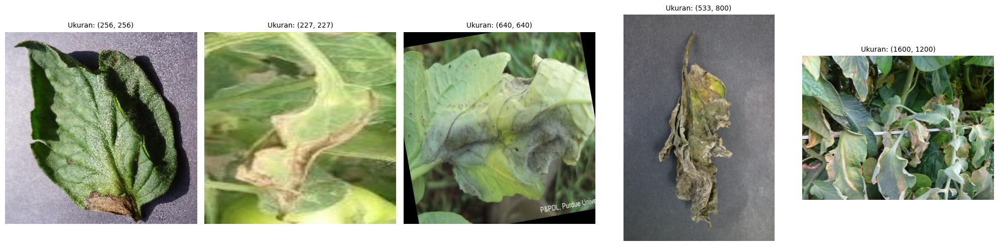

In [26]:
def show_example_images_of_common_sizes(root_dir, top_k=5):
    sets = ['data']
    size_counter = Counter()
    example_paths = defaultdict(str)

    for dataset in sets:
        dataset_path = os.path.join(root_dir, dataset)
        for class_name in os.listdir(dataset_path):
            class_path = os.path.join(dataset_path, class_name)
            if not os.path.isdir(class_path):
                continue

            for img_file in os.listdir(class_path):
                img_path = os.path.join(class_path, img_file)
                try:
                    with Image.open(img_path) as img:
                        size = img.size
                        size_counter[size] += 1
                        if size not in example_paths:
                            example_paths[size] = img_path
                except:
                    continue  # skip corrupted or unreadable images

    # Ambil top-k ukuran gambar berdasarkan frekuensi kemunculan
    most_common_sizes = size_counter.most_common(top_k)
    print(f"Ukuran gambar paling umum (top {top_k}):")
    for size, count in most_common_sizes:
        print(f"  {size} → {count} gambar")

    print(f"\nJumlah ukuran gambar berbeda: {len(size_counter)}")

    # Tampilkan contoh gambar dari setiap ukuran
    plt.figure(figsize=(4 * top_k, 5))
    for idx, (size, _) in enumerate(most_common_sizes):
        img_path = example_paths[size]
        with Image.open(img_path) as img:
            plt.subplot(1, top_k, idx + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Ukuran: {size}", fontsize=10)
    plt.tight_layout()
    plt.show()

# Contoh penggunaan:
show_example_images_of_common_sizes("", top_k=5)

Kemudian, lanjut mempersiapkan dataset gambar agar bisa dilatih dengan model machine learning. Kita menentukan folder data (`/data`), lalu mengubah semua gambar menjadi ukuran 224x224 piksel dan memprosesnya dalam kelompok (batch) berisi 16 gambar. Fungsi `image_dataset_from_directory` secara otomatis membaca gambar dari subfolder dan mengenali nama subfolder sebagai label kelas. Gambar pelatihan diacak untuk membantu model belajar lebih baik, sedangkan gambar validasi tidak diacak karena hanya untuk evaluasi. Terakhir, daftar nama kelas ditampilkan untuk memastikan label terbaca dengan benar.

### 🧼 Data Preprocessing
Melakukan pembagian data serta augmentasi data.

#### ✂️ Split Dataset
membagi dataset citra yang tersimpan dalam folder data, di mana setiap subfolder merepresentasikan satu kelas, ke dalam tiga subset: `train (70%)`, `val (15%)`, dan `test (15%)`. Proses dimulai dengan membuat struktur folder `dataset_split/train, val, dan test` untuk setiap kelas. Selanjutnya, semua gambar dalam setiap kelas diacak, kemudian dibagi menggunakan `train_test_split` dari scikit-learn berdasarkan rasio yang ditentukan. Gambar-gambar hasil split kemudian disalin ke folder yang sesuai, memastikan bahwa data pelatihan, validasi, dan pengujian tersebar secara acak namun proporsional, sehingga model dapat dilatih dan diuji secara adil dan akurat pada data yang belum pernah dilihat sebelumnya.

In [27]:
# Path awal
original_dataset_dir = 'data'
output_base_dir = 'dataset_split'

# Rasio split
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# Buat folder train/val/test
for split in ['train', 'val', 'test']:
    for class_name in os.listdir(original_dataset_dir):
        os.makedirs(os.path.join(output_base_dir, split, class_name), exist_ok=True)

# Bagi dataset per kelas
for class_name in os.listdir(original_dataset_dir):
    class_path = os.path.join(original_dataset_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    files = os.listdir(class_path)
    files = [f for f in files if os.path.isfile(os.path.join(class_path, f))]
    random.shuffle(files)

    train_files, temp_files = train_test_split(files, test_size=(1 - train_ratio), random_state=42)
    val_files, test_files = train_test_split(temp_files, test_size=(test_ratio / (test_ratio + val_ratio)), random_state=42)

    for f in train_files:
        shutil.copy(os.path.join(class_path, f), os.path.join(output_base_dir, 'train', class_name, f))
    for f in val_files:
        shutil.copy(os.path.join(class_path, f), os.path.join(output_base_dir, 'val', class_name, f))
    for f in test_files:
        shutil.copy(os.path.join(class_path, f), os.path.join(output_base_dir, 'test', class_name, f))


In [28]:
train_dir = os.path.join(output_base_dir, 'train')
val_dir = os.path.join(output_base_dir, 'val')
test_dir = os.path.join(output_base_dir, 'test')

# Fungsi untuk menghitung jumlah file per kelas dalam sebuah direktori
def count_images_per_class(directory):
    return {
        cls: len(os.listdir(os.path.join(directory, cls)))
        for cls in os.listdir(directory)
        if os.path.isdir(os.path.join(directory, cls))
    }
    
# Hitung jumlah gambar per kelas
train_counts = count_images_per_class(train_dir)
val_counts = count_images_per_class(val_dir)
test_counts = count_images_per_class(test_dir)
total_gambar = sum(train_counts.values()) + sum(val_counts.values()) + sum(test_counts.values())

# Gabungkan ke dalam DataFrame
df = pd.DataFrame({
    'Train': train_counts,
    'Validation': val_counts,
    'Test': test_counts
}).T.fillna(0).astype(int).T  # Transpose agar kelas sebagai indeks


print(f"Total gambar : {total_gambar}")
# Tampilkan sebagai tabel
print("\nSebaran Data per Kelas:")
print(df)



Total gambar : 32531

Sebaran Data per Kelas:
                                      Train  Validation  Test
Late_blight                            2733         586   586
powdery_mildew                          879         188   189
Tomato_mosaic_virus                    1915         411   411
Septoria_leaf_spot                     2539         544   545
Tomato_Yellow_Leaf_Curl_Virus          1773         380   381
Spider_mites Two-spotted_spider_mite   1527         327   328
Early_blight                           2168         465   465
Bacterial_spot                         2490         534   534
Leaf_Mold                              2445         524   524
Target_Spot                            1598         343   343
healthy                                2699         578   579



Dataset ini terdiri dari `32.531 gambar` yang mencakup `11` kelas penyakit dan kondisi tanaman sehat. Dataset dibagi ke dalam tiga subset utama:

- `Train (70%)`
- `Validation (15%)`
- `Test (15%)`

Tujuan dari pembagian ini adalah untuk memastikan bahwa model dapat:
- Dilatih secara efektif menggunakan subset *train*,
- Disesuaikan parameternya menggunakan *validation*,
- Dan dievaluasi secara objektif terhadap data yang tidak pernah dilihat sebelumnya melalui *test set*.

Berikut adalah contoh tampilan gambar dari masing-masing kelas.

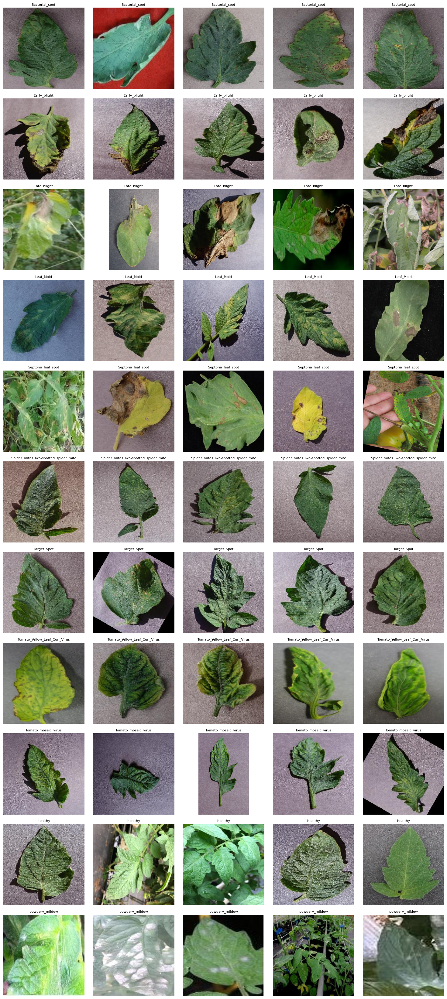

In [29]:
# Jumlah gambar yang ingin ditampilkan per kelas
num_images_per_class = 5

# Ambil daftar nama kelas dari folder training
class_names = sorted(os.listdir(train_dir))

# Atur ukuran kanvas berdasarkan jumlah gambar dan kelas
plt.figure(figsize=(num_images_per_class * 3, len(class_names) * 3))

img_index = 1
for class_name in class_names:
    class_path = os.path.join(train_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    # Ambil gambar acak dari folder kelas
    images = os.listdir(class_path)
    sampled_images = random.sample(images, min(num_images_per_class, len(images)))

    for img_name in sampled_images:
        img_path = os.path.join(class_path, img_name)
        try:
            img = Image.open(img_path)
            # Buat subplot untuk setiap gambar
            plt.subplot(len(class_names), num_images_per_class, img_index)
            plt.imshow(img)
            plt.axis('off')
            # Tampilkan nama kelas sebagai judul
            plt.title(class_name, fontsize=8)
        except:
            # Lewati jika ada error saat membuka gambar
            continue
        img_index += 1

# Tata letak rapi agar tidak saling menumpuk
plt.tight_layout()
plt.show()

In [38]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 16
SEED = 42

#### 🎨 Augmentasi Data
Selanjutnya, kita akan melakukan **augmentasi data gambar** saat pelatihan model deep learning. Teknik ini membantu meningkatkan **keragaman data latih** tanpa perlu menambah data baru secara manual, sehingga model menjadi lebih **tahan terhadap overfitting** dan lebih mampu mengenali pola dari berbagai variasi gambar.

Sementara itu, data validasi dan test hanya menggunakan normalisasi. Tujuannya adalah menjaga gambar validasi dan test tetap **representatif** terhadap data asli, tanpa augmentasi, agar evaluasi performa model lebih objektif.

In [39]:
train_datagen = ImageDataGenerator(
    rescale=1./255,                # Normalisasi piksel gambar dari 0-255 menjadi 0-1
    rotation_range=20,            # Rotasi gambar acak hingga 20 derajat
    zoom_range=0.2,               # Zoom acak hingga 20% untuk mensimulasikan perbedaan jarak
    width_shift_range=0.2,        # Geser gambar secara horizontal hingga 20% lebar gambar
    height_shift_range=0.2,       # Geser gambar secara vertikal hingga 20% tinggi gambar
    shear_range=0.15,             # Distorsi gambar secara miring (shear)
    horizontal_flip=True,         # Membalik gambar secara horizontal (misalnya daun kiri dan kanan)
    brightness_range=[0.8, 1.2],  # Variasi pencahayaan gambar
    fill_mode='nearest'           # Isi area kosong hasil transformasi dengan piksel terdekat
)

val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

Kode di bawah digunakan untuk **mempersiapkan data gambar dari folder agar bisa digunakan untuk pelatihan (train), validasi (valid), dan pengujian (test)** model deep learning. Proses ini sangat penting untuk **mempercepat dan menyederhanakan proses pelatihan model**.

In [ ]:
train_generator = train_datagen.flow_from_directory(
    train_dir,  # Folder berisi data latih
    target_size = IMG_SIZE,         # Ukuran gambar diubah menjadi 224x224
    batch_size = BATCH_SIZE,        # Jumlah gambar per batch
    class_mode = 'categorical',       # Label dalam format one-hot (karena klasifikasi multi-kelas)
    shuffle = True,                   # Acak data untuk melatih model dengan lebih baik
    seed = SEED                         # Seed untuk konsistensi hasil saat diacak
)


val_generator = val_datagen.flow_from_directory(
    val_dir,  # Folder validasi
    target_size = IMG_SIZE,
    batch_size = BATCH_SIZE,
    class_mode = 'categorical',
    shuffle = False,                  # Tidak diacak agar evaluasi konsisten
    seed = 42
)

test_generator = test_datagen.flow_from_directory(
    test_dir,   # Folder pengujian
    target_size = IMG_SIZE,
    batch_size = BATCH_SIZE,
    class_mode = 'categorical',
    shuffle = False,                  # Tidak diacak agar prediksi bisa dibandingkan langsung
    seed = 42
)

Found 22766 images belonging to 11 classes.
Found 4880 images belonging to 11 classes.
Found 4885 images belonging to 11 classes.


Output tersebut menunjukkan jumlah total gambar dalam masing-masing subset dataset:

- **Train:** Terdapat **22.766** gambar yang digunakan untuk melatih model. Data ini merupakan bagian terbesar dari data karena model membutuhkan banyak contoh untuk belajar pola.
- **Valid:** Terdapat **4.880** gambar untuk **validasi**. Data ini digunakan untuk mengevaluasi performa model selama pelatihan, tanpa memengaruhi parameter model.
- **Test:** Terdapat **4.885** gambar untuk **pengujian akhir**. Dataset ini digunakan setelah pelatihan selesai untuk mengukur performa model secara objektif terhadap data baru yang belum pernah dilihat.

Pembagian ini umum dalam proyek machine learning untuk memastikan model tidak hanya menghafal data, tapi juga bisa **menggeneralisasi** ke data baru.

Kemudian, kita akan menampilkan gambar hasil augmentasi sebagai berikut.

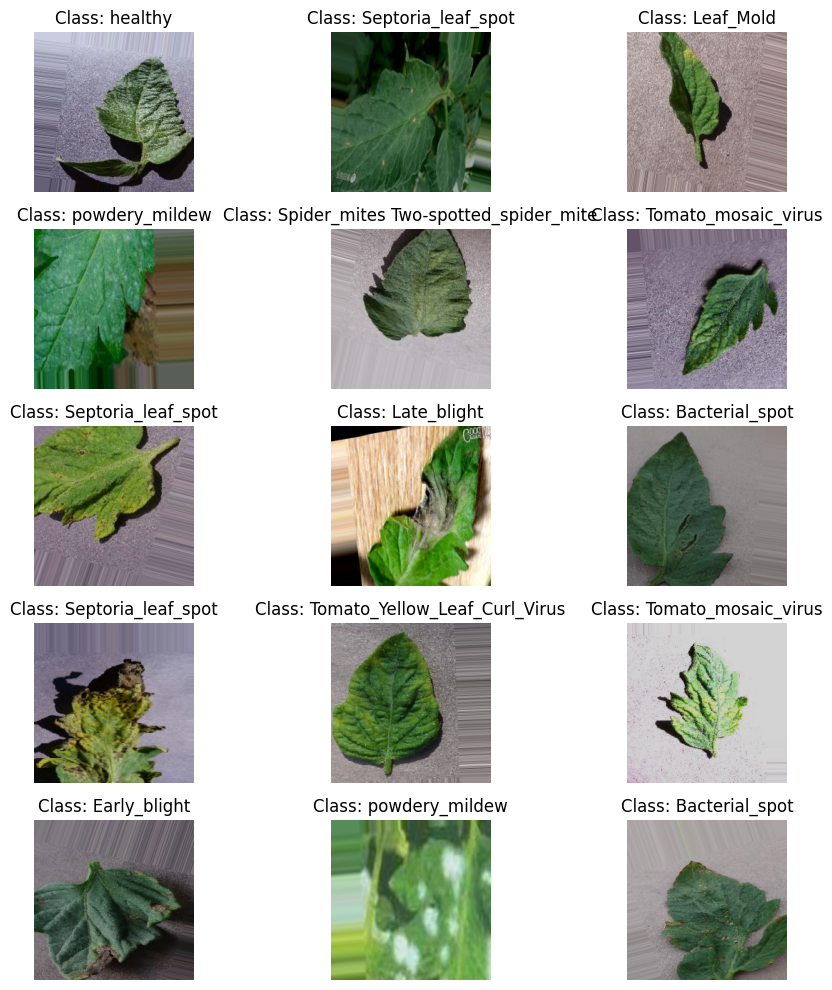

In [41]:
# Ambil satu batch gambar hasil augmentasi dari generator training
augmented_images, labels = next(train_generator)

# Tampilkan 9 gambar hasil augmentasi pertama
plt.figure(figsize=(10, 10))  # Ukuran plot keseluruhan
for i in range(15):  # Loop untuk 9 gambar pertama
    plt.subplot(5, 3, i + 1)  # Membuat subplot 3x3
    plt.imshow(augmented_images[i])  # Tampilkan gambar ke-i
    # Menampilkan nama kelas berdasarkan posisi label one-hot
    plt.title(f"Class: {class_names[labels[i].argmax()]}")
    plt.axis('off')  # Hilangkan sumbu koordinat untuk tampilan bersih

plt.tight_layout()  # Atur tata letak agar tidak saling tumpang tindih
plt.show()  # Tampilkan semua subplot

## 🧠 Modelling

#### 🏗️ Arsitektur Model
Membangun struktur CNN serta menggunakan model pretrained.

**MobileNetV2** adalah arsitektur jaringan saraf tiruan (neural network) yang dirancang oleh Google untuk **mengenali gambar dengan cepat dan efisien**, **terutama di perangkat seluler**. Model ini bekerja seperti "otak buatan" yang dilatih untuk mengenali objek dalam gambar, misalnya membedakan antara kucing dan anjing. Keunggulan utamanya adalah ringan dan cepat, sehingga cocok digunakan di aplikasi mobile tanpa membutuhkan komputer besar. MobileNetV2 menggunakan teknik khusus agar tetap akurat meskipun ukurannya kecil, membuatnya ideal untuk digunakan dalam aplikasi yang membutuhkan pengenalan gambar secara real-time.

In [ ]:
# Load pre-trained MobileNetV2
base_model = MobileNetV2(
    input_shape=(*IMG_SIZE, 3),
    include_top=False,
    weights='imagenet'
)

# Bangun model secara berurutan (Sequential)
model = Sequential([
    base_model,  # Gunakan sebagai feature extractor

    # Tambahan layer konvolusi dan pooling untuk menangkap fitur lebih lanjut
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),

    # Lapisan untuk meratakan fitur dan menambahkan klasifikasi
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(11, activation='softmax')  # Output layer dengan 11 kelas (one-hot)
])

# Kompilasi model dengan Adam optimizer dan categorical crossentropy
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',  # Cocok untuk multi-class classification
    metrics=['accuracy']              # Evaluasi menggunakan akurasi
)

Kode berikut membangun arsitektur deep learning menggunakan **MobileNetV2** sebagai **feature extractor** dengan bobot pralatih dari ImageNet. Bagian atas (top layer) dihilangkan agar bisa diganti dengan layer khusus untuk klasifikasi dataset kita. Model ditambahkan dengan layer Conv2D dan pooling, lalu diratakan menggunakan `GlobalAveragePooling2D`, diikuti dua layer Dense untuk menghasilkan output klasifikasi ke 11 kelas. Base model dibekukan agar bobotnya tidak ikut dilatih, sehingga pelatihan lebih cepat dan fokus pada layer baru.

In [43]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 7, 7, 64)       │       737,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 3, 3, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,005,067 (11.46 MB)

 Trainable params: 2,970,955 (11.33 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [ ]:
# EarlyStopping: hentikan training jika val_loss tidak membaik selama 5 epoch
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# ModelCheckpoint: simpan model terbaik ke file berdasarkan val_accuracy
model_checkpoint = ModelCheckpoint(
    'mymodel.keras',
    monitor='val_accuracy',
    save_best_only=True
    
)

# ReduceLROnPlateau: turunkan learning rate jika val_loss stagnan
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    verbose=1,
    min_lr=1e-6
)

# Hitung class weights agar model tidak bias ke kelas mayoritas
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights_dict = dict(enumerate(class_weights))

# Custom Callback: cetak akurasi training & validasi setelah tiap epoch
class CustomCallback(Callback):
    """Callback untuk memonitor progress training"""

    def on_epoch_begin(self, epoch, logs=None):
        print(f"\nEpoch {epoch + 1}/{self.params['epochs']} dimulai")

    def on_epoch_end(self, epoch, logs=None):
        # Format metrik dengan presisi 4 digit
        metrics_str = " - ".join([f"{k}: {v:.4f}" for k, v in logs.items()])
        print(f"✅ Epoch {epoch + 1}/{self.params['epochs']} selesai - {metrics_str}")

    def on_train_begin(self, logs=None):
        print("🚀 Training dimulai!")

    def on_train_end(self, logs=None):
        print("🎉 Training selesai! Model telah mencapai epoch terakhir atau dihentikan lebih awal.")

custom_logger = CustomCallback()

*Callback* digunakan untuk membantu proses pelatihan berjalan lebih efisien dan akurat. `EarlyStopping` menghentikan training jika akurasi validasi tidak membaik setelah beberapa epoch. `ModelCheckpoint` menyimpan model terbaik berdasarkan akurasi validasi. `ReduceLROnPlateau` menurunkan learning rate jika validasi loss stagnan. Selain itu, ditambahkan juga *class weights* untuk mengatasi ketidakseimbangan kelas dalam data, dan *custom callback* untuk mencetak akurasi secara langsung di akhir setiap epoch.

#### 🚀 Training Model
Melatih model menggunakan data latih dan validasi, serta memantau metrik performa.

In [45]:
# Training model
history = model.fit(
    train_generator,
    epochs=35,
    validation_data=val_generator,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, model_checkpoint, reduce_lr, custom_logger]
)

🚀 Training dimulai!

Epoch 1/35 dimulai
Epoch 1/35
1371/1423 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - accuracy: 0.5479 - loss: 1.3501

2025-05-20 01:48:01.910833: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14015', 8 bytes spill stores, 8 bytes spill loads



1423/1423 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.5521 - loss: 1.3376✅ Epoch 1/35 selesai - accuracy: 0.6623 - loss: 1.0036 - val_accuracy: 0.2035 - val_loss: 6.8403 - learning_rate: 0.0010
1423/1423 ━━━━━━━━━━━━━━━━━━━━ 327s 194ms/step - accuracy: 0.5521 - loss: 1.3373 - val_accuracy: 0.2035 - val_loss: 6.8403 - learning_rate: 0.0010

Epoch 2/35 dimulai
Epoch 2/35
1423/1423 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - accuracy: 0.7919 - loss: 0.6101✅ Epoch 2/35 selesai - accuracy: 0.8014 - loss: 0.5778 - val_accuracy: 0.6656 - val_loss: 1.7008 - learning_rate: 0.0010
1423/1423 ━━━━━━━━━━━━━━━━━━━━ 232s 163ms/step - accuracy: 0.7919 - loss: 0.6101 - val_accuracy: 0.6656 - val_loss: 1.7008 - learning_rate: 0.0010

Epoch 3/35 dimulai
Epoch 3/35
1423/1423 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - accuracy: 0.8168 - loss: 0.5218✅ Epoch 3/35 selesai - accuracy: 0.8221 - loss: 0.5089 - val_accuracy: 0.7877 - val_loss: 0.7349 - learning_rate: 0.0010
1423/1423 ━━━━━━━━━━━━━━━━━━━━ 227s 160ms/step 

## 📊 Evaluasi dan Visualisasi

#### 📈 Akurasi Training dan Testing
Menghitung performa model di data pelatihan dan pengujian.

In [46]:
# Evaluasi model pada dataset test
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.4f}")  # Cetak akurasi pada test set

# Ambil nilai akurasi terakhir dari proses training
train_acc = history.history['accuracy'][-1]  # Mengakses akurasi epoch terakhir
print(f"Training Accuracy: {train_acc:.4f}")  # Cetak akurasi training

303/306 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.9600 - loss: 0.1248

2025-05-20 03:53:42.433136: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1211', 8 bytes spill stores, 8 bytes spill loads



306/306 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - accuracy: 0.9602 - loss: 0.1242
Test Accuracy: 0.9760
Training Accuracy: 0.9876


#### 🖼️ Plot Akurasi dan Loss Model
Menampilkan grafik untuk memahami proses pelatihan model.

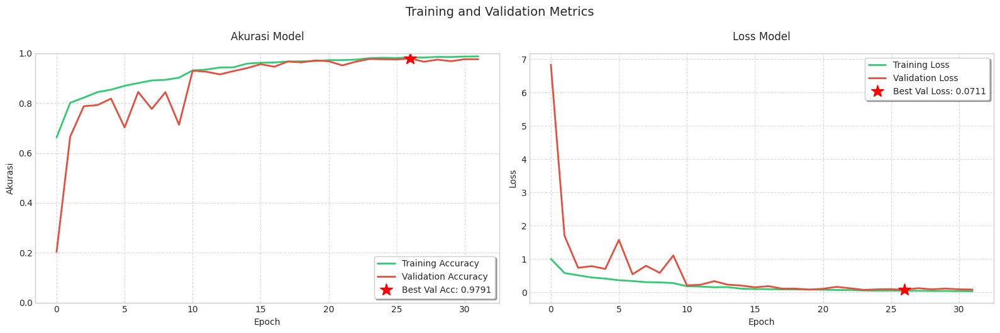


Best Validation Loss: 0.0711 (Epoch 27)
Best Validation Accuracy: 0.9791 (Epoch 27)


In [48]:

def plot_history_custom(history, figsize=(16,5)):
    plt.style.use("seaborn-v0_8-whitegrid")

    fig, axes = plt.subplots(1, 2, figsize=figsize)

    # Plot Akurasi
    axes[0].plot(history.history['accuracy'], label='Training Accuracy', color='#2ecc71', linewidth=2)
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy', color='#e74c3c', linewidth=2)
    axes[0].set_title('Akurasi Model', fontsize=12, pad=15)
    axes[0].set_xlabel('Epoch', fontsize=10)
    axes[0].set_ylabel('Akurasi', fontsize=10)
    axes[0].set_ylim([0,1])
    axes[0].grid(True, linestyle='--', alpha=0.7)
    axes[0].legend(frameon=True, fancybox=True, shadow=True, loc='lower right')

    # Tandai best validation accuracy dengan bintang merah
    best_val_acc_epoch = np.argmax(history.history['val_accuracy'])
    axes[0].plot(best_val_acc_epoch, history.history['val_accuracy'][best_val_acc_epoch],
                 'r*', markersize=15,
                 label=f'Best Val Acc: {history.history["val_accuracy"][best_val_acc_epoch]:.4f}')
    axes[0].legend(frameon=True, fancybox=True, shadow=True, loc='lower right')

    # Plot Loss
    axes[1].plot(history.history['loss'], label='Training Loss', color='#2ecc71', linewidth=2)
    axes[1].plot(history.history['val_loss'], label='Validation Loss', color='#e74c3c', linewidth=2)
    axes[1].set_title('Loss Model', fontsize=12, pad=15)
    axes[1].set_xlabel('Epoch', fontsize=10)
    axes[1].set_ylabel('Loss', fontsize=10)
    axes[1].grid(True, linestyle='--', alpha=0.7)
    axes[1].legend(frameon=True, fancybox=True, shadow=True, loc='upper right')

    # Tandai best validation loss dengan bintang merah
    best_val_loss_epoch = np.argmin(history.history['val_loss'])
    axes[1].plot(best_val_loss_epoch, history.history['val_loss'][best_val_loss_epoch],
                 'r*', markersize=15,
                 label=f'Best Val Loss: {history.history["val_loss"][best_val_loss_epoch]:.4f}')
    axes[1].legend(frameon=True, fancybox=True, shadow=True, loc='upper right')

    plt.tight_layout()
    fig.suptitle('Training and Validation Metrics', fontsize=14, y=1.05)
    plt.show()

    print(f"\nBest Validation Loss: {history.history['val_loss'][best_val_loss_epoch]:.4f} (Epoch {best_val_loss_epoch + 1})")
    print(f"Best Validation Accuracy: {history.history['val_accuracy'][best_val_acc_epoch]:.4f} (Epoch {best_val_acc_epoch + 1})")

# Contoh pemakaian:
plot_history_custom(history)

Grafik di atas menunjukkan perkembangan kinerja model selama proses pelatihan (training) dalam dua aspek utama: **akurasi** (grafik kiri) dan **loss** atau kesalahan prediksi (grafik kanan), baik untuk data training maupun validasi (uji coba).

Pada grafik **Akurasi Model** di kiri, terlihat bahwa akurasi model terus meningkat seiring bertambahnya jumlah epoch (putaran pelatihan), baik untuk data training maupun data validasi. Hal ini berarti model semakin baik dalam mengenali pola data. Di akhir pelatihan, akurasi mencapai 98%, baik pada data pelatihan maupun validasi, yang menunjukkan bahwa model telah belajar dengan sangat baik dan mampu mengenali data baru dengan cukup akurat.

Sementara itu, pada grafik **Loss Model** di kanan, terlihat bahwa nilai loss pada data training turun secara konsisten, hal ini menandakan bahwa kesalahan model dalam memprediksi semakin kecil. Loss pada data validasi juga menurun drastis, meskipun sempat naik-turun sedikit di tengah jalan, namun akhirnya menurun hingga sangat kecil. Hal ini menunjukkan bahwa model tidak hanya belajar dari data pelatihan, tetapi juga bisa menggeneralisasi (beradaptasi) dengan baik pada data yang belum pernah dilihat sebelumnya.

Secara keseluruhan, grafik ini menunjukkan bahwa proses pelatihan berjalan dengan baik, dan model yang dihasilkan sangat akurat serta tidak mengalami overfitting yang berarti.

#### 📋 Classification Report & 🔢 Confusion Matrix
Menampilkan jumlah prediksi benar dan salah untuk tiap kelas dalam bentuk matriks.
Menampilkan precision, recall, dan f1-score tiap kelas.

306/306 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step


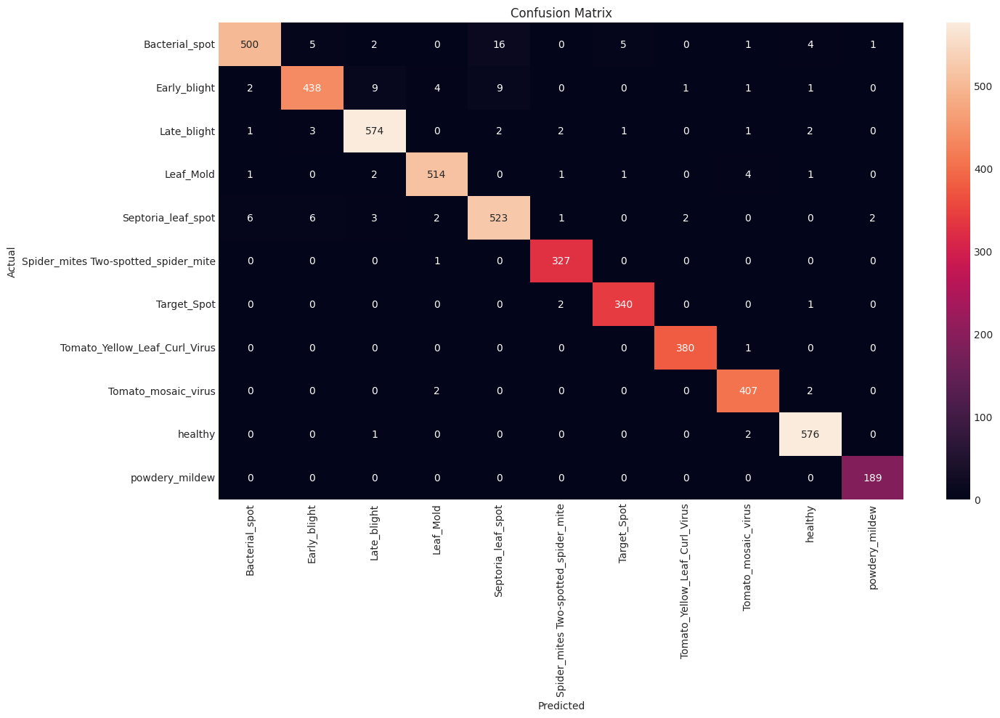

                                      precision    recall  f1-score   support

                      Bacterial_spot       0.98      0.94      0.96       534
                        Early_blight       0.97      0.94      0.96       465
                         Late_blight       0.97      0.98      0.98       586
                           Leaf_Mold       0.98      0.98      0.98       524
                  Septoria_leaf_spot       0.95      0.96      0.96       545
Spider_mites Two-spotted_spider_mite       0.98      1.00      0.99       328
                         Target_Spot       0.98      0.99      0.99       343
       Tomato_Yellow_Leaf_Curl_Virus       0.99      1.00      0.99       381
                 Tomato_mosaic_virus       0.98      0.99      0.98       411
                             healthy       0.98      0.99      0.99       579
                      powdery_mildew       0.98      1.00      0.99       189

                            accuracy                          

In [49]:
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

cm = confusion_matrix(y_true, y_pred_classes)

plt.figure(figsize=(15, 10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.savefig("confusion_matrix.png")
plt.show()

report = classification_report(y_true, y_pred_classes, target_names=class_names)
print(report)


Grafik di atas adalah **confusion matrix**, yang menunjukkan seberapa baik model mengenali gambar dari masing-masing kategori daun tomat, termasuk berbagai penyakit dan kondisi sehat. Baris menunjukkan label sebenarnya (kondisi yang benar) dan kolom menunjukkan label yang diprediksi oleh model.

Dari grafik ini, kita bisa melihat bahwa sebagian besar kotak berwarna biru tua berada di diagonal (kiri atas ke kanan bawah), yang artinya model sering memprediksi dengan benar. Namun, ada beberapa kasus di mana model masih melakukan kesalahan.

Secara keseluruhan, model ini sudah sangat baik dalam mengklasifikasikan gambar dengan akurat, meskipun masih ada sedikit kebingungan antara beberapa penyakit yang mungkin mirip secara tampilan.

Hasil di atas menunjukkan seberapa baik model mengenali berbagai jenis penyakit daun tomat dan kondisi sehat. Tiga metrik utama yang ditampilkan adalah:

- **Precision** (ketepatan): Seberapa banyak prediksi benar dari semua yang diprediksi sebagai suatu kelas.
- **Recall** (cakupan): Seberapa banyak data benar yang berhasil dikenali model.
- **F1-score**: Rata-rata harmonis dari precision dan recall, menunjukkan keseimbangan antara keduanya.

Model ini menunjukkan performa yang sangat baik, meskipun ada sedikit penurunan pada beberapa kategori. Secara umum performa model sudah sangat baik dan dapat diandalkan untuk mengenali penyakit daun tomat dari gambar.

## 🔄 Konversi Model
Mengubah model ke format SavedModel, TF-Lite dan TFJS.

In [53]:
# Load model dari file .keras
model_convert = tf.keras.models.load_model("mymodel.keras")

# Fungsi untuk menyimpan labels.txt
def save_labels(class_names, output_path="labels.txt"):
    with open(output_path, "w") as f:
        for label in class_names:
            f.write(f"{label}\n")

# 1. Simpan ke format SavedModel
saved_model_path = "saved_model"
model_convert.export(saved_model_path)

# 2. Simpan ke format TFLite
def save_as_tflite(model, output_path):
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    converter = tf.lite.TFLiteConverter.from_keras_model(model)
    tflite_model = converter.convert()
    with open(output_path, "wb") as f:
        f.write(tflite_model)

tflite_output_path = "tflite/model.tflite"
save_as_tflite(model_convert, tflite_output_path)
print(f"✅ Model disimpan sebagai SavedModel di: {saved_model_path}")

# Simpan label.txt untuk TFLite
save_labels(class_names, output_path="tflite/labels.txt")
print(f"✅ Model disimpan sebagai TFLite di: {tflite_output_path}")

# 3. Simpan ke format TF.js
def save_as_tfjs(model, output_path):
    tfjs.converters.save_keras_model(model, output_path)

tfjs_output_path = "tfjs_model"
save_as_tfjs(model_convert, tfjs_output_path)

# Simpan label.txt untuk TFJS (opsional: bisa di dalam folder TFJS juga)
save_labels(class_names, output_path="tfjs_model/labels.txt")
print(f"✅ Model disimpan sebagai TensorFlow.js di: {tfjs_output_path}")

print("✅ Model berhasil disimpan dalam format: SavedModel (.pb), TFLite (.tflite), TensorFlow.js (TFJS), dan labels.txt")


INFO:tensorflow:Assets written to: saved_model/assets


INFO:tensorflow:Assets written to: saved_model/assets


Saved artifact at 'saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_4')
Output Type:
  TensorSpec(shape=(None, 11), dtype=tf.float32, name=None)
Captures:
  140672174957648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140672134954448: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962057296: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140672134953680: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140672134954256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962058832: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962059216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962059600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962059408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962058064: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962060752: 

INFO:tensorflow:Assets written to: /tmp/tmpcka3wty6/assets


Saved artifact at '/tmp/tmpcka3wty6'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_4')
Output Type:
  TensorSpec(shape=(None, 11), dtype=tf.float32, name=None)
Captures:
  140672174957648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140672134954448: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962057296: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140672134953680: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140672134954256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962058832: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962059216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962059600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962059408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962058064: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140670962060

W0000 00:00:1747688518.439403     877 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1747688518.439931     877 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
2025-05-20 04:01:58.441332: I tensorflow/cc/saved_model/reader.cc:83] Reading SavedModel from: /tmp/tmpcka3wty6
2025-05-20 04:01:58.454855: I tensorflow/cc/saved_model/reader.cc:52] Reading meta graph with tags { serve }
2025-05-20 04:01:58.454887: I tensorflow/cc/saved_model/reader.cc:147] Reading SavedModel debug info (if present) from: /tmp/tmpcka3wty6
2025-05-20 04:01:58.682527: I tensorflow/cc/saved_model/loader.cc:236] Restoring SavedModel bundle.
2025-05-20 04:01:59.731223: I tensorflow/cc/saved_model/loader.cc:220] Running initialization op on SavedModel bundle at path: /tmp/tmpcka3wty6
2025-05-20 04:01:59.912897: I tensorflow/cc/saved_model/loader.cc:471] SavedModel load for tags { serve }; Status: success: OK. Took 1471575 microseconds.


✅ Model disimpan sebagai SavedModel di: saved_model
✅ Model disimpan sebagai TFLite di: tflite/model.tflite
failed to lookup keras version from the file,
    this is likely a weight only file
✅ Model disimpan sebagai TensorFlow.js di: tfjs_model
✅ Model berhasil disimpan dalam format: SavedModel (.pb), TFLite (.tflite), TensorFlow.js (TFJS), dan labels.txt


## 🤖 Inference
Menggunakan model yang sudah dilatih untuk memprediksi gambar.

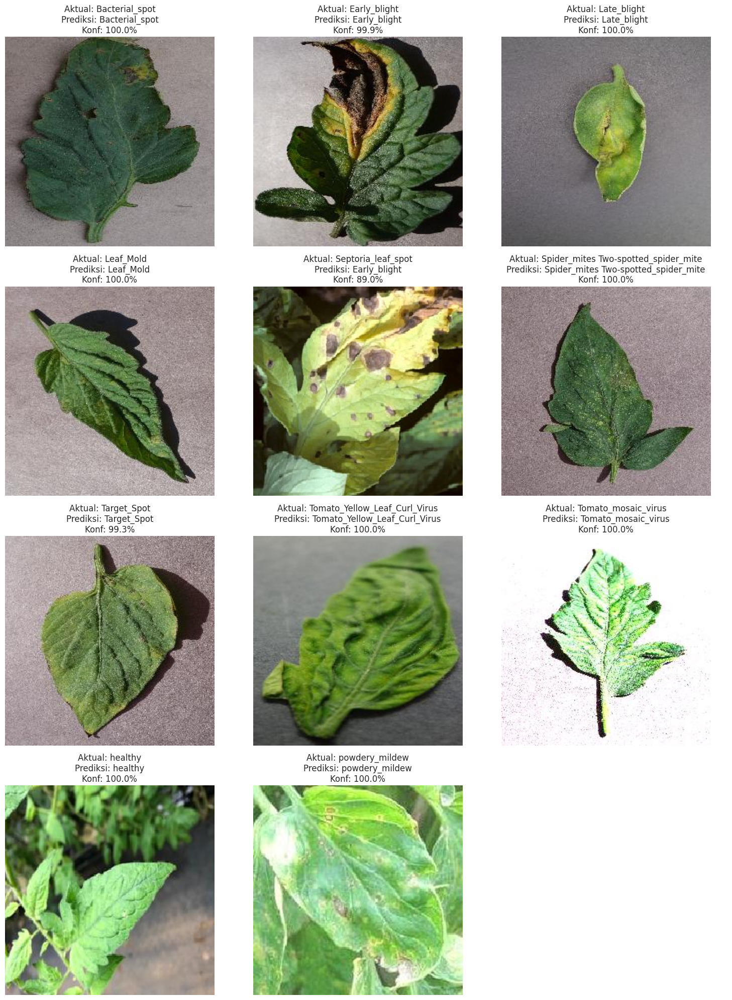

In [ ]:
# Load model
model_pred = TFSMLayer('saved_model', call_endpoint='serving_default')

# Ambil nama-nama kelas
data_dir = 'dataset_split/test'  # contoh: 'dataset/test'
class_names = sorted(os.listdir(data_dir))
samples_per_class = 1  # jumlah gambar diambil per kelas

# Kumpulan hasil prediksi untuk visualisasi
images, titles = [], []

# Ambil dan proses gambar
for class_name in class_names:
    class_path = os.path.join(data_dir, class_name)
    image_files = os.listdir(class_path)
    selected_files = np.random.choice(image_files, size=samples_per_class, replace=False)

    for img_file in selected_files:
        img_path = os.path.join(class_path, img_file)
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img) / 255.0
        img_array = np.expand_dims(img_array, axis=0)

        # Predict
        preds_dict = model_pred(img_array, training=False)
        preds = list(preds_dict.values())[0]
        predicted_index = np.argmax(preds)
        predicted_label = class_names[predicted_index]
        confidence = np.max(preds) * 100

        # Simpan untuk plotting
        images.append(img)
        titles.append(f"Aktual: {class_name}\nPrediksi: {predicted_label}\nKonf: {confidence:.1f}%")

# Plot grid 3 kolom
cols = 3
rows = int(np.ceil(len(images) / cols))
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))

for idx, ax in enumerate(axes.flat):
    if idx < len(images):
        ax.imshow(images[idx])
        ax.set_title(titles[idx])
        ax.axis('off')
    else:
        ax.axis('off')  # kosongkan sisa slot

plt.tight_layout()
plt.show()

Gambar ini menunjukkan hasil prediksi model terhadap berbagai jenis penyakit daun tomat berdasarkan citra daun. Setiap gambar menampilkan **label asli (aktual)**, **hasil prediksi model**, dan **tingkat kepercayaan (konfidensi)** model terhadap prediksinya. Dari semua contoh, hampir seluruh gambar berhasil diprediksi **dengan benar** dan **tingkat kepercayaan yang sangat tinggi** (sebagian besar mendekati 100%). Hal ini menunjukkan bahwa model dapat **mengenali gejala penyakit daun tomat dengan sangat akurat**, seperti *Bacterial_spot*, *Early_blight*, *Leaf Mold*, hingga kondisi *healthy* (daun sehat).

Secara keseluruhan, model mampu mendeteksi penyakit daun dari gambar secara sangat efektif dan bisa menjadi **alat bantu yang bermanfaat bagi petani atau praktisi pertanian** untuk mendeteksi penyakit sejak dini.